# Seam Carving for Content-Aware Image Resizing

This notebook implements the seam carving algorithm for content-aware image resizing as described in the paper "Seam Carving for Content-Aware Image Resizing".

## Import

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import tqdm

## Utility Functions

First, let's implement the necessary utility functions for image processing and seam carving.

In [75]:
def my_conv2d(kernel, img, conv_type="same"):
    """
    Implement 2D image convolution
    :param kernel: float/int array, shape: (x, x)
    :param img: float/int array, shape: (height, width)
    :param conv_type: str, convolution padding choices, should in ['full', 'same', 'valid']
    :return conv results, numpy array
    """
    # Get dimensions
    k_h, k_w = kernel.shape
    i_h, i_w = img.shape

    # Rotate kernel by 180 degrees for convolution
    kernel = np.rot90(kernel, 2)

    # Calculate output dimensions based on conv_type
    half_k_h = k_h // 2
    half_k_w = k_w // 2
    if conv_type == "full":
        pad_h = k_h - 1
        pad_w = k_w - 1
        out_h = i_h + pad_h - 1
        out_w = i_w + pad_w - 1
    elif conv_type == "same":
        pad_h = (k_h - 1) // 2
        pad_w = (k_w - 1) // 2
        out_h = i_h
        out_w = i_w
    elif conv_type == "valid":
        pad_h = pad_w = 0
        out_h = i_h - k_h + 1
        out_w = i_w - k_w + 1
    else:
        raise ValueError("conv_type must be 'full', 'same', or 'valid'")

    # Pad the image
    padded_img = np.pad(
        img, ((pad_h, pad_h), (pad_w, pad_w)), mode="constant", constant_values=0
    )

    # Perform convolution
    result = np.zeros((out_h, out_w))
    for i in range(out_h):
        for j in range(out_w):
            result[i, j] = np.sum(padded_img[i : i + k_h, j : j + k_w] * kernel)

    return result


def clip_show(img):
    max_val = np.percentile(img, 99)
    min_val = np.min(img)
    img = np.clip(img, min_val, max_val)
    img = (img - min_val) / (max_val - min_val) * 255
    return img.astype(np.uint8)


def plot_2_fig(
    origin_img,
    conv_img,
    title1,
    title2,
    cmap="gray",
    target_width=2000,
    target_height=1000,
    dpi=100,
):
    plt.figure(figsize=(target_width / dpi, target_height / dpi), dpi=dpi)

    # Plot original image
    plt.subplot(1, 2, 1)
    plt.imshow(origin_img, cmap=cmap)
    plt.title(title1)

    # Plot convolution result
    plt.subplot(1, 2, 2)
    plt.imshow(conv_img, cmap=cmap)
    plt.title(title2)

    plt.tight_layout()
    plt.show()


def generate_gaussian_kernel(size, sigma=1.0):
    """This function generates a 2D Gaussian kernel. And it output a 2D numpy array whose values are the Gaussian values between 0 and 1."""
    # generate an axis
    x = np.linspace(-size // 2, size // 2, size)
    gauss_x = np.exp(-(x**2) / (2 * sigma**2))

    # generate a 2D gaussian kernel and normalize
    gauss_2d = np.outer(gauss_x, gauss_x)
    gauss_2d /= gauss_2d.sum()
    return gauss_2d

def get_derivative_magnitude(img, size, sigma, strategy=1):
    gaussian_kernel = generate_gaussian_kernel(size, sigma)
    derivative_x_kernel = (np.array([[0, 0, 0], [-1, 0, 1], [0, 0, 0]], dtype=np.float32) / 2.0)
    derivative_y_kernel = (np.array([[0, 1, 0], [0, 0, 0], [0, -1, 0]], dtype=np.float32) / 2.0)
    derivative_x_gaussian_kernel = my_conv2d(derivative_x_kernel, gaussian_kernel, conv_type="same")
    derivative_y_gaussian_kernel = my_conv2d(derivative_y_kernel, gaussian_kernel, conv_type="same")

    derivative_x = []
    derivative_y = []
    for i in tqdm.tqdm(range(img.shape[2])):
        derivative_x.append(my_conv2d(derivative_x_gaussian_kernel, img[:, :, i], conv_type="same"))
        derivative_y.append(my_conv2d(derivative_y_gaussian_kernel, img[:, :, i], conv_type="same"))
        derivative_x[i] = clip_show(np.abs(derivative_x[i]))
        derivative_y[i] = clip_show(np.abs(derivative_y[i]))

    derivative_magnitude = np.zeros(img.shape[:2])
    if strategy == 1:
        for i in range(img.shape[2]):
            derivative_magnitude += np.sqrt(derivative_x[i]**2 + derivative_y[i]**2) # sum of all channels
    elif strategy == 2:
        derivative_magnitude = np.maximum(
            np.maximum(
                np.abs(derivative_x[0]) + np.abs(derivative_y[0]),
								np.abs(derivative_x[1]) + np.abs(derivative_y[1]),
            ),
            np.abs(derivative_x[2]) + np.abs(derivative_y[2]),
        )  # max of two channels
    else:
        derivative_magnitude = 0.299 * np.abs(derivative_x[0]) + np.abs(derivative_y[0]) + 0.587 * np.abs(derivative_x[1]) + np.abs(derivative_y[1]) + 0.114 * np.abs(derivative_x[2]) + np.abs(derivative_y[2]) # weighted sum of three channels
    return derivative_magnitude

def find_min(arr):
    min_index = 0
    for i in range(len(arr)):
        if arr[i] < arr[min_index]:
            min_index = i
    return min_index, arr[min_index]

## Seam Carving Functions

Now we'll implement the core seam carving functionality.

In [80]:
def find_y_seam_box(img, strategy=3, size=5, sigma=1.5):
    """Find a vertical seam in the image"""
    h, w, c = img.shape
    derivative_magnitude = get_derivative_magnitude(img, size, sigma, strategy)
    energy_map = derivative_magnitude / np.max(derivative_magnitude) # change to 0-1
    
    img_padded = np.pad(energy_map, ((0, 0), (1, 1)), mode="constant", constant_values=10)
    # create a point matrix (h* w) to store its link point to the previous row
    point_matrix = np.zeros((h, w), int)
    
    for i in range(1, h):
        for j in range(w):
            min_point, min_val = find_min(img_padded[i - 1, j:j + 3]) # 0, 1, 2
            point_matrix[i, j] = j + min_point - 1
            energy_map[i, j] += min_val
            
    # find the seam with the smallest energy
    finial_y_index = find_min(energy_map[-1, :])[0]
    seam_box = []
    for i in range(h - 1, -1, -1): # from bottom to top
        seam_box.append((i, finial_y_index))
        finial_y_index = point_matrix[i, finial_y_index]
    seam_box.reverse()
        
    return seam_box

def remove_y_seam(img, seam_box):
    """Remove a vertical seam from the image"""
    h, w, c = img.shape
    reduced_img = np.zeros((h, w - 1, c))
    for i in range(h):
        seam = seam_box[i]
        reduced_img[i, :, :] = np.delete(img[i, :, :], seam[1], axis=0)
    return reduced_img

def find_x_seam_box(img, strategy=3, size=5, sigma=1.5):
    """Find a horizontal seam in the image"""
    # Transpose the image to reuse the vertical seam finding code
    transposed_img = np.transpose(img, (1, 0, 2))
    seam_box = find_y_seam_box(transposed_img, strategy, size, sigma)
    # Swap the coordinates back
    return [(y, x) for (x, y) in seam_box]

def remove_x_seam(img, seam_box):
    """Remove a horizontal seam from the image"""
    h, w, c = img.shape
    reduced_img = np.zeros((h - 1, w, c))
    for i in range(w):
        seam = seam_box[i]
        reduced_img[:, i, :] = np.delete(img[:, i, :], seam[0], axis=0)
    return reduced_img

## Seam Carver Class

Let's implement the SeamCarver class that provides a high-level interface for the seam carving operations.

In [ ]:
class SeamCarver(object):
    def __init__(self):
        pass

    def reduce_height(self, img, num_pixels, strategy=3):
        """
        Implement reduce height part for 3D image in paper "Seam Carving for Content-Aware Image Resizing".
        :param img: float/int array, given image, shape: (height, width, channel)
        :param num_pixels: int, the number of reduced height.
        :return reduced results, a 3D image numpy array (height, width, channel).
        """
        reduced_img = img.copy()
        for i in tqdm.tqdm(range(num_pixels)):
            seam_box = find_x_seam_box(reduced_img, strategy, size=3, sigma=1.0)
            reduced_img = remove_x_seam(reduced_img, seam_box)
        return reduced_img

    def reduce_width(self, img, num_pixels, strategy=3):
        """
        Implement reduce width part for 3D image in paper "Seam Carving for Content-Aware Image Resizing".
        :param img: float/int array, given image, shape: (height, width, channel)
        :param num_pixels: int, the number of reduced width.
        :return reduced results, a 3D image numpy array (height, width, channel).
        """
        reduced_img = img.copy()
        for i in tqdm.tqdm(range(num_pixels)):
            seam_box = find_y_seam_box(reduced_img, strategy, size=3, sigma=1.0)
            reduced_img = remove_y_seam(reduced_img, seam_box)
        return reduced_img

    # This is a approximate method to visualize seams on the original image (change to red)
    def visualize_seam(self, img, orientation='vertical', num_seams=1):
        """Visualize seams on the original image"""
        result_img = img.copy()

        for _ in range(num_seams):
            if orientation == 'vertical':
                seam_box = find_y_seam_box(result_img)
                # Mark seam in red
                for i, j in seam_box:
                    result_img[i, j] = [255, 0, 0]  # Red in RGB
            else:  # horizontal
                seam_box = find_x_seam_box(result_img)
                # Mark seam in red
                for i, j in seam_box:
                    result_img[i, j] = [255, 0, 0]  # Red in RGB

        return result_img

## Demo & Testing

Now let's test the seam carving algorithm on sample images.

### Load Image

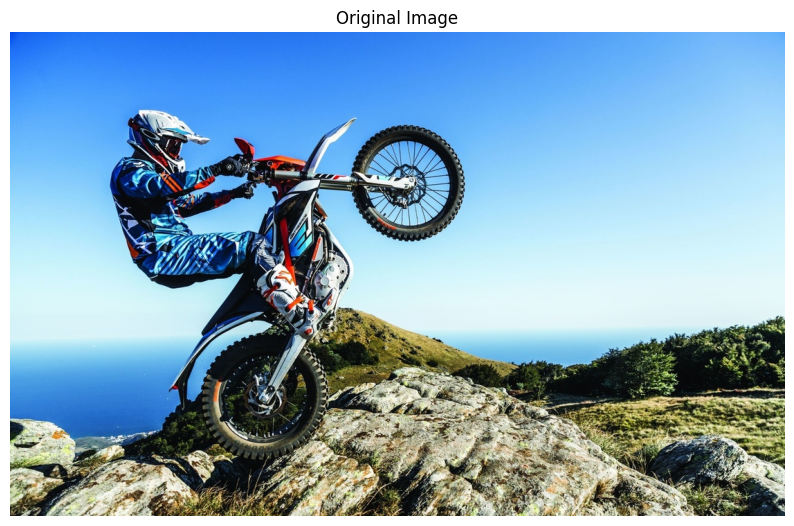

Image shape: (700, 1120, 3)


In [60]:
# Load an example image
path = "src/problem5_seam/motor.jpg"  # Update this path as needed
img = cv2.imread(path)

# change BGR to RGB
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Display the original image
plt.figure(figsize=(10, 8))
plt.imshow(img)
plt.title("Original Image")
plt.axis('off')
plt.show()

# Print image shape information
print(f"Image shape: {img.shape}")

### Visualize Energy Map

100%|██████████| 3/3 [00:17<00:00,  5.80s/it]


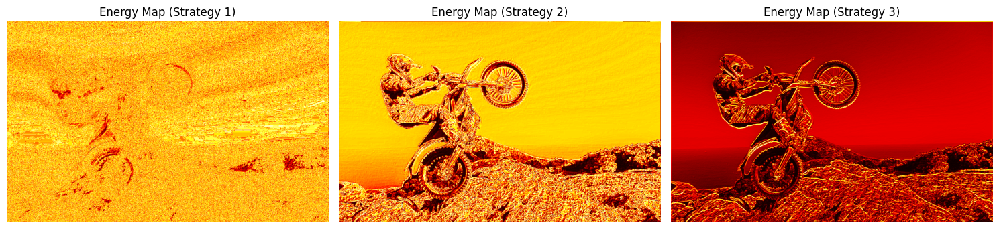

In [61]:
# Calculate and display the energy map
energy_3 = get_derivative_magnitude(img, size=5, sigma=1.5, strategy=3)
energy_2 = get_derivative_magnitude(img, size=5, sigma=1.5, strategy=2)
energy_1 = get_derivative_magnitude(img, size=5, sigma=1.5, strategy=1)

plt.figure(figsize=(15, 5))
plt.subplot(131)
plt.imshow(energy_1, cmap='hot')
plt.title("Energy Map (Strategy 1)")
plt.axis('off')

plt.subplot(132)
plt.imshow(energy_2, cmap='hot')
plt.title("Energy Map (Strategy 2)")
plt.axis('off')

plt.subplot(133)
plt.imshow(energy_3, cmap='hot')
plt.title("Energy Map (Strategy 3)")
plt.axis('off')

plt.tight_layout()
plt.show()

### Visualize Seams

100%|██████████| 3/3 [00:24<00:00,  8.32s/it]


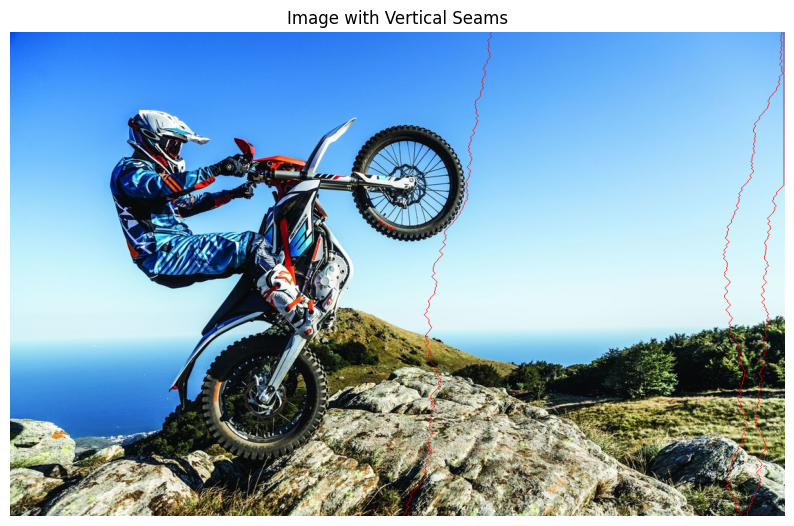

In [67]:
seam_carver = SeamCarver()

# Visualize vertical seams
img_with_vseams = seam_carver.visualize_seam(
    img.copy(), orientation="vertical", num_seams=3
)

plt.figure(figsize=(10, 8))
plt.imshow(img_with_vseams.astype(np.uint8))
plt.title("Image with Vertical Seams")
plt.axis("off")
plt.show()

100%|██████████| 3/3 [00:14<00:00,  4.98s/it]


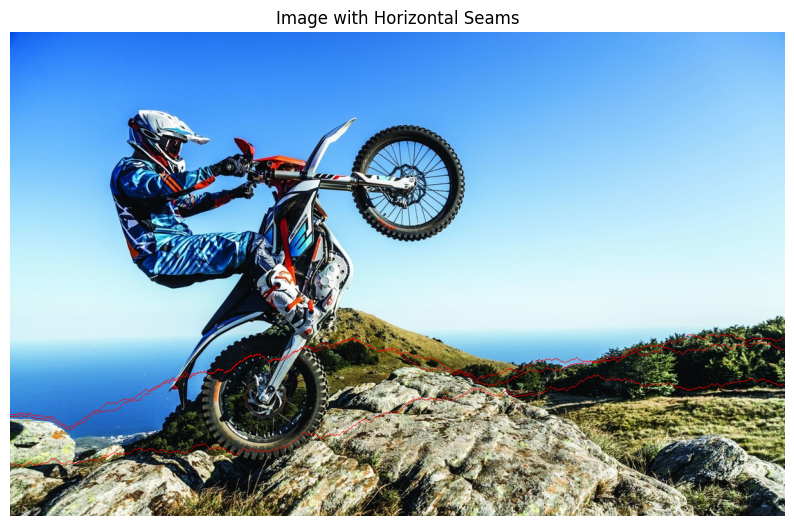

In [81]:
# Visualize horizontal seams
seam_carver = SeamCarver()
img_with_hseams = seam_carver.visualize_seam(
    img.copy(), orientation="horizontal", num_seams=3
)

plt.figure(figsize=(10, 8))
plt.imshow(img_with_hseams.astype(np.uint8))
plt.title("Image with Horizontal Seams")
plt.axis("off")
plt.show()

### Reduce Width

100%|██████████| 50/50 [12:18<00:00, 14.77s/it]


img shape:  (700, 1120, 3)
reduced shape:  (700, 1070, 3)


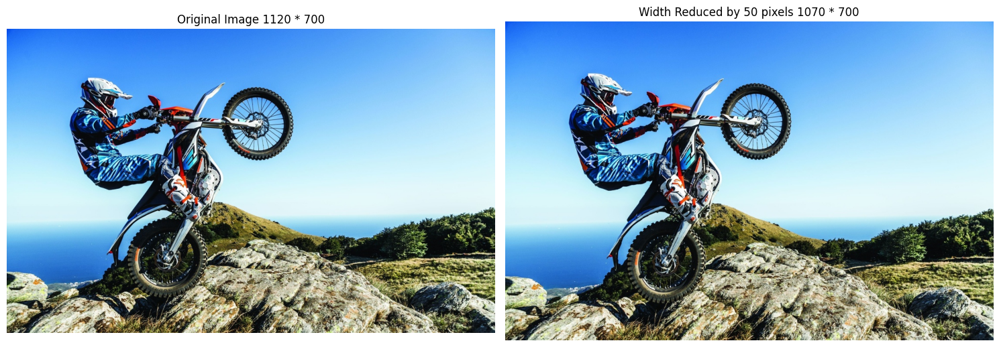

In [ ]:
# Reduce width by 1 pixels
num_pixels = 1
reduced_width_img = seam_carver.reduce_width(img, num_pixels)

plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1)
#print("img:", img)
print("img shape: ", img.shape)
plt.imshow(img.astype(np.uint8))
plt.title(f"Original Image {img.shape[1]} * {img.shape[0]}")
plt.axis('off')

plt.subplot(1, 2, 2)
#print("reduced: ", reduced_width_img)
print("reduced shape: ", reduced_width_img.shape)
plt.imshow(reduced_width_img.astype(np.uint8))
plt.title(f"Width Reduced by {num_pixels} pixels {reduced_width_img.shape[1]} * {reduced_width_img.shape[0]}")
plt.axis('off')

plt.tight_layout()
plt.show()

### Reduce Height

  1%|          | 1/100 [00:16<27:18, 16.55s/it]

Reduced height: 1/100


 11%|█         | 11/100 [02:49<22:28, 15.15s/it]

Reduced height: 11/100


 21%|██        | 21/100 [05:23<20:19, 15.43s/it]

Reduced height: 21/100


 31%|███       | 31/100 [07:50<16:52, 14.67s/it]

Reduced height: 31/100


 41%|████      | 41/100 [10:15<14:09, 14.41s/it]

Reduced height: 41/100


 51%|█████     | 51/100 [12:36<11:23, 13.94s/it]

Reduced height: 51/100


 61%|██████    | 61/100 [14:57<09:14, 14.21s/it]

Reduced height: 61/100


 71%|███████   | 71/100 [17:12<06:27, 13.35s/it]

Reduced height: 71/100


 81%|████████  | 81/100 [22:24<08:29, 26.84s/it]

Reduced height: 81/100


 91%|█████████ | 91/100 [24:33<01:59, 13.32s/it]

Reduced height: 91/100


100%|██████████| 100/100 [26:28<00:00, 15.88s/it]


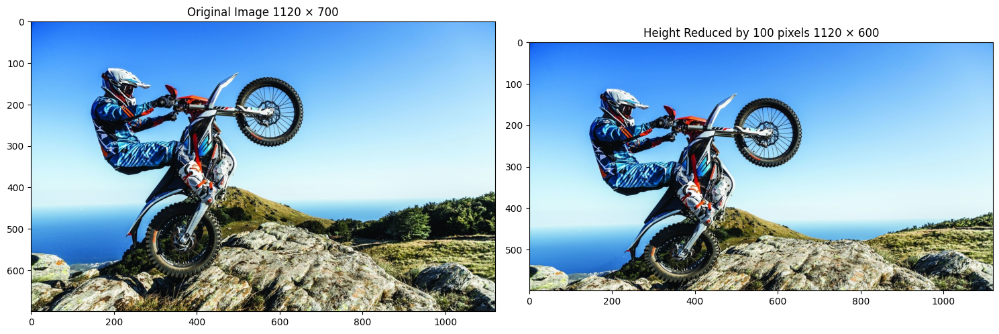

  1%|          | 1/100 [00:29<48:26, 29.35s/it]

Reduced height: 1/100


 11%|█         | 11/100 [02:59<22:16, 15.01s/it]

Reduced height: 11/100


 21%|██        | 21/100 [05:22<18:35, 14.12s/it]

Reduced height: 21/100


 31%|███       | 31/100 [07:42<16:12, 14.10s/it]

Reduced height: 31/100


 41%|████      | 41/100 [10:23<14:07, 14.36s/it]

Reduced height: 41/100


 51%|█████     | 51/100 [13:34<14:28, 17.73s/it]

Reduced height: 51/100


 61%|██████    | 61/100 [15:47<08:40, 13.33s/it]

Reduced height: 61/100


 71%|███████   | 71/100 [19:00<07:12, 14.93s/it]

Reduced height: 71/100


 81%|████████  | 81/100 [21:07<04:02, 12.75s/it]

Reduced height: 81/100


 91%|█████████ | 91/100 [23:12<01:52, 12.50s/it]

Reduced height: 91/100


100%|██████████| 100/100 [25:07<00:00, 15.08s/it]


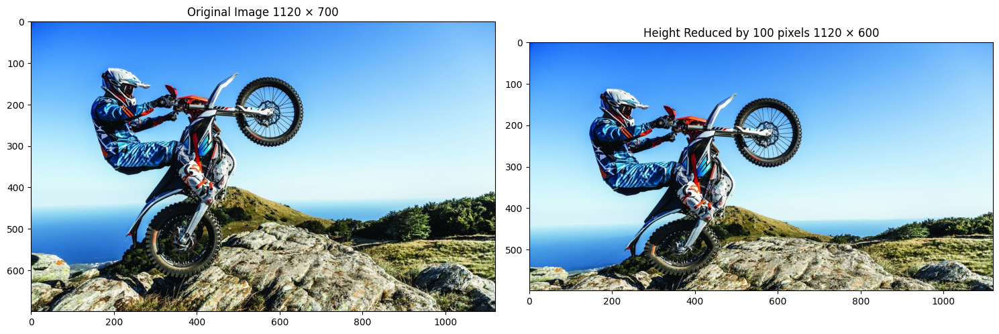

  1%|          | 1/100 [00:15<25:08, 15.24s/it]

Reduced height: 1/100


 11%|█         | 11/100 [02:39<20:55, 14.10s/it]

Reduced height: 11/100


 21%|██        | 21/100 [06:39<42:43, 32.45s/it]

Reduced height: 21/100


 31%|███       | 31/100 [10:32<41:31, 36.10s/it]

Reduced height: 31/100


 41%|████      | 41/100 [12:53<14:14, 14.48s/it]

Reduced height: 41/100


 51%|█████     | 51/100 [15:06<10:50, 13.28s/it]

Reduced height: 51/100


 61%|██████    | 61/100 [18:28<21:05, 32.45s/it]

Reduced height: 61/100


 71%|███████   | 71/100 [21:26<07:04, 14.64s/it]

Reduced height: 71/100


 81%|████████  | 81/100 [23:53<04:32, 14.36s/it]

Reduced height: 81/100


 91%|█████████ | 91/100 [32:33<08:38, 57.58s/it]

Reduced height: 91/100


100%|██████████| 100/100 [41:44<00:00, 25.05s/it]


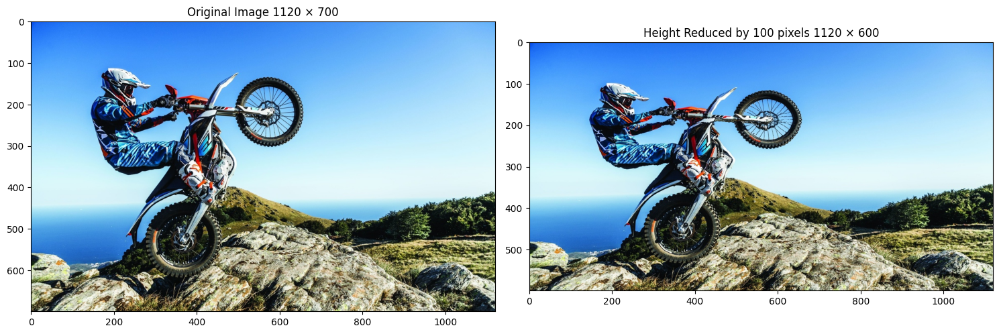

In [84]:
# Reduce height by 100 pixels
num_pixels = 100
reduced_height_img = seam_carver.reduce_height(img, num_pixels, strategy=3)

plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1)
plt.imshow(img.astype(np.uint8))
plt.title(f"Original Image {img.shape[1]} × {img.shape[0]}")

plt.subplot(1, 2, 2)
plt.imshow(reduced_height_img.astype(np.uint8))
plt.title(f"Height Reduced by {num_pixels} pixels {reduced_height_img.shape[1]} × {reduced_height_img.shape[0]}")

plt.tight_layout()
plt.show()

reduced_height_img = seam_carver.reduce_height(img, num_pixels, strategy=2)

plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1)
plt.imshow(img.astype(np.uint8))
plt.title(f"Original Image {img.shape[1]} × {img.shape[0]}")

plt.subplot(1, 2, 2)
plt.imshow(reduced_height_img.astype(np.uint8))
plt.title(f"Height Reduced by {num_pixels} pixels {reduced_height_img.shape[1]} × {reduced_height_img.shape[0]}")

plt.tight_layout()
plt.show()

reduced_height_img = seam_carver.reduce_height(img, num_pixels, strategy=1)

plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1)
plt.imshow(img.astype(np.uint8))
plt.title(f"Original Image {img.shape[1]} × {img.shape[0]}")

plt.subplot(1, 2, 2)
plt.imshow(reduced_height_img.astype(np.uint8))
plt.title(f"Height Reduced by {num_pixels} pixels {reduced_height_img.shape[1]} × {reduced_height_img.shape[0]}")

plt.tight_layout()
plt.show()

### Combined Reduction

100%|██████████| 3/3 [00:12<00:00,  4.21s/it]


Reduced height: 1/100


100%|██████████| 3/3 [00:12<00:00,  4.01s/it]


Reduced height: 11/100


100%|██████████| 3/3 [01:05<00:00, 21.94s/it]


Reduced height: 21/100


100%|██████████| 3/3 [00:12<00:00,  4.24s/it]


Reduced height: 31/100


100%|██████████| 3/3 [00:12<00:00,  4.03s/it]


Reduced height: 41/100


100%|██████████| 3/3 [00:11<00:00,  3.92s/it]


Reduced height: 51/100


100%|██████████| 3/3 [00:12<00:00,  4.30s/it]


Reduced height: 61/100


100%|██████████| 3/3 [00:12<00:00,  4.04s/it]


Reduced height: 71/100


100%|██████████| 3/3 [00:11<00:00,  3.89s/it]


Reduced height: 81/100


100%|██████████| 3/3 [00:11<00:00,  3.85s/it]


Reduced height: 91/100


100%|██████████| 3/3 [00:11<00:00,  3.92s/it]


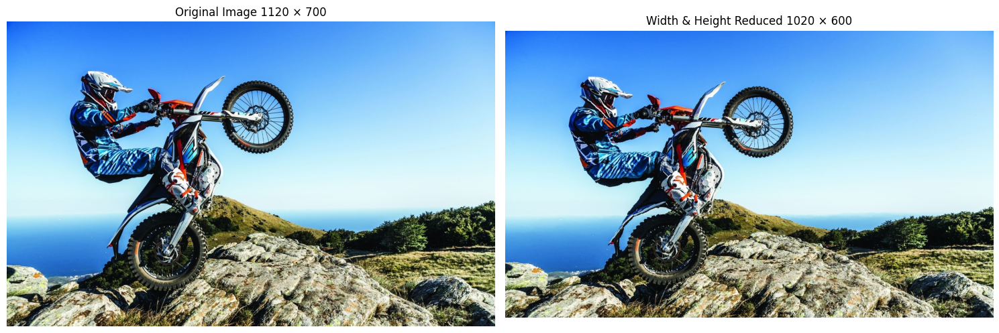

In [46]:
# Reduce both width and height
width_reduction = 100
height_reduction = 100

reduced_both = img.copy()
reduced_both = seam_carver.reduce_width(reduced_both, width_reduction)
reduced_both = seam_carver.reduce_height(reduced_both, height_reduction)

plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1)
plt.imshow(img.astype(np.uint8))
plt.title(f"Original Image {img.shape[1]} × {img.shape[0]}")
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(reduced_both.astype(np.uint8))
plt.title(f"Width & Height Reduced {reduced_both.shape[1]} × {reduced_both.shape[0]}")
plt.axis('off')

plt.tight_layout()
plt.show()